In [1]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras as keras
import imageio
import moviepy.editor as mpy
import os

In [2]:
cd C:\\Users\\Yan-Ru\\Desktop\\Lab 14-2

C:\Users\Yan-Ru\Desktop\Lab 14-2


In [3]:
SAMPLE_COL = 8
SAMPLE_ROW = 8
SAMPLE_NUM = SAMPLE_COL * SAMPLE_ROW

IMG_H = 64
IMG_W = 64
IMG_C = 3
IMG_SHAPE = (IMG_H, IMG_W, IMG_C)

BATCH_SIZE = 100
Z_DIM = 128
BZ = (BATCH_SIZE, Z_DIM)
BUF = 20000

In [4]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the first GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


# Dataset

對照片的前處理，壓縮成 tfrecord 儲存。
把影像 resize 成 64x64 讀入，用 BATCH SIZE=100 做成 dataset。

In [5]:
def check_folders(PATH):
    if not os.path.exists(PATH):
        os.makedirs(PATH)

In [6]:
check_folders("./imgs")
check_folders("./tfrecord")
check_folders("./checkpoints/train")

In [7]:
img_names = []
FILE_LENGTH=202600

for i in range(1,FILE_LENGTH):
    img_name = str(i)
    pad_zero = str(0)*(6-len(img_name))
    img_name = "./img_align_celeba_png/"+pad_zero + img_name + '.png'
    img_names.append(img_name)

In [8]:
class DatasetGenerator:
    def __init__(self,img_names):
        num=0
        ITEMS_PER_FILE = 2000
        self.PATH="./tfrecord/"
#         for i in range(0,len(img_names),ITEMS_PER_FILE):
#             raw_image_data = tf.data.Dataset.from_tensor_slices(img_names[i:i+ITEMS_PER_FILE])
#             raw_image_data = raw_image_data.map(self._load_img,num_parallel_calls=tf.data.experimental.AUTOTUNE)
#             serialized_features_dataset = raw_image_data.map(self._tf_serialize_example,num_parallel_calls=tf.data.experimental.AUTOTUNE)
#             filename = f'train_{num:03d}_.tfrecord'
#             writer = tf.data.experimental.TFRecordWriter(self.PATH+filename)
#             writer.write(serialized_features_dataset)
#             num+=1
            
    def _load_img(self,img_name):
        raw_img = tf.io.read_file(img_name)
        return raw_img
    
    def _bytes_feature(self,value):
        """Returns a bytes_list from a string / byte."""
        if isinstance(value, type(tf.constant(0))):
            value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

    def _serialize_example(self,img):
        feature = {
            'img': self._bytes_feature(img)
        }

        example_proto = tf.train.Example(features=tf.train.Features(feature=feature))

        return example_proto.SerializeToString()

    def _tf_serialize_example(self,img):
        tf_string = tf.py_function(
            self._serialize_example,
            [img],
            tf.string)
        return tf.reshape(tf_string, ())
    
    def _parse_function(self,example_proto):
        self.feature_description = {
            'img': tf.io.FixedLenFeature([], tf.string),
        }
        parsed = tf.io.parse_single_example(example_proto, self.feature_description)
        return parsed['img']
    
    def processing(self,raw_img):
        img = tf.image.decode_png(raw_img, channels=3)
        img = tf.image.resize(img, (IMG_H, IMG_W))
        img = tf.cast(img,tf.float32)
        img = img / 255.
        return img
    
    def generate(self):
        filename_list = []
        TFRECORDS = os.listdir("./tfrecord")
        for i in range(len(TFRECORDS)):
            filename_list.append(self.PATH+f'train_{i:03d}_.tfrecord')
        raw_dataset_train = tf.data.TFRecordDataset(filename_list)
        parsed_dataset_train = raw_dataset_train.map(self._parse_function)
        dsTrain = parsed_dataset_train.map(self.processing)
        dsTrain = dsTrain.shuffle(BUF)
        dsTrain = dsTrain.batch(BATCH_SIZE,drop_remainder=True)
        dsTrain = dsTrain.prefetch(500)
        return dsTrain

In [9]:
dsTrain = DatasetGenerator(img_names).generate()

In [10]:
# Utility function
def utPuzzle(imgs, row, col, path=None):
    h, w, c = imgs[0].shape
    out = np.zeros((h * row, w * col, c), np.uint8)
    for n, img in enumerate(imgs):
        j, i = divmod(n, col)
        out[j * h : (j + 1) * h, i * w : (i + 1) * w, :] = img
    if path is not None : imageio.imwrite(path, out)
    return out
  
def utMakeGif(imgs, fname, duration):
    n = float(len(imgs)) / duration
    clip = mpy.VideoClip(lambda t : imgs[int(n * t)], duration = duration)
    clip.write_gif(fname, fps = n)

# DCGAN model 

In [16]:
def GAN(img_shape, z_dim):
    # x-shape
    xh, xw, xc = img_shape
    # z-shape
    zh = xh // 4
    zw = xw // 4
        
    # return Generator and Discriminator
    return keras.Sequential([ # Generator
        keras.layers.Dense(units  =  1024, input_shape = (z_dim,)),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Dense(units  =  zh * zw << 8), # zh * zw * 256
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Reshape(target_shape = (zh, zw, 256)),
        keras.layers.Conv2DTranspose(
            filters = 32,
            kernel_size = 5,
            strides = 2,
            padding = "SAME"
        ),
        keras.layers.BatchNormalization(),
        keras.layers.ReLU(),
        keras.layers.Conv2DTranspose(
            filters = xc,
            kernel_size = 5,
            strides = 2,
            padding = "SAME",
            activation = keras.activations.sigmoid
        ),
    ]), keras.Sequential([ # Discriminator
        keras.layers.Conv2D(
            filters = 32,
            kernel_size = 5,
            strides = (2, 2),
            padding = "SAME",
            input_shape = img_shape,
        ),
        keras.layers.LeakyReLU(),
        keras.layers.Conv2D(
            filters = 128,
            kernel_size = 5,
            strides = (2, 2),
            padding = "SAME"
        ),
        keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(),
        keras.layers.Flatten(),
        keras.layers.Dense(units  =  1024),
        keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(),
        keras.layers.Dense(units  =  1),
    ])

s = tf.random.normal([SAMPLE_NUM, Z_DIM])

In [17]:
modified_W_LR = 1e-4
modified_W_EPOCH = 300
modified_WG, modified_WD = GAN(IMG_SHAPE, Z_DIM)
optimizer_g = keras.optimizers.Adam(learning_rate=modified_W_LR,beta_1=0.,beta_2=0.9)
optimizer_d = keras.optimizers.Adam(learning_rate=modified_W_LR,beta_1=0.,beta_2=0.9)

learning rate 為 $10^{-4}$，epoch 為 300。

In [18]:
@tf.function
def WGTrain(c1):
    z = tf.random.normal(BZ)
    with tf.GradientTape() as tpg:
        with tf.GradientTape() as tp_gradientpenalty:
            x_bar = modified_WG(z, training = True)

            eps = tf.random.uniform([BATCH_SIZE,1,1,1])
            x = c1
            x_hat = eps * x + (1. - eps) * x_bar

            z1 = modified_WD(x, training = True)
            z0 = modified_WD(x_bar, training = True)
            penalty = modified_WD(x_hat, training = True)
            gradient_penalty = tp_gradientpenalty.gradient(penalty,x_hat)
            gradient_penalty = tf.sqrt(tf.reduce_sum(tf.math.square(gradient_penalty),axis=[1,2,3]))
            loss = z0 - z1 + 10. * tf.math.square((gradient_penalty - 1.))
            ld = tf.reduce_mean(loss)
            lg = - tf.reduce_mean(z0)

    gradient_g = tpg.gradient(lg, modified_WG.trainable_variables)

    optimizer_g.apply_gradients(zip(gradient_g, modified_WG.trainable_variables))
    
    return lg, ld

@tf.function
def WDTrain(c1):
    z = tf.random.normal(BZ)
    with tf.GradientTape() as tpd:
        with tf.GradientTape() as tp_gradientpenalty:
            x_bar = modified_WG(z, training = True)

            eps = tf.random.uniform([BATCH_SIZE,1,1,1])
            x = c1
            x_hat = eps * x + (1. - eps) * x_bar

            z1 = modified_WD(x, training = True)
            z0 = modified_WD(x_bar, training = True)
            penalty = modified_WD(x_hat, training = True)
            gradient_penalty = tp_gradientpenalty.gradient(penalty,x_hat)
            gradient_penalty = tf.sqrt(tf.reduce_sum(tf.math.square(gradient_penalty),axis=[1,2,3]))
            loss = z0 - z1 + 10. * tf.math.square((gradient_penalty - 1.))
            ld = tf.reduce_mean(loss)
            lg = - tf.reduce_mean(z0)

    gradient_d = tpd.gradient(ld, modified_WD.trainable_variables)

    optimizer_d.apply_gradients(zip(gradient_d, modified_WD.trainable_variables))
    
    return lg, ld

# Improved WGAN
* $\epsilon$ 為從0~1.常態分佈隨機產生的變數
* $\hat{x} = \epsilon * x + (1.-\epsilon) * \bar{x}$
* $\hat{x}$ 帶到 Discriminator 中，得到 penalty 再去算梯度。

In [19]:
WTrain = (
    WDTrain,
    WDTrain,
    WDTrain,
    WDTrain,
    WDTrain,
    WGTrain
)

WCritic = len(WTrain)

In [21]:
checkpoint_path = "./checkpoints/train"
WLD_PATH='./wld.txt'
WLG_PATH='./wlg.txt'
ckpt = tf.train.Checkpoint(epoch=tf.Variable(0), modified_WG = modified_WG,
                           modified_WD = modified_WD,
                           optimizer_g = optimizer_g,
                           optimizer_d = optimizer_d)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=10)

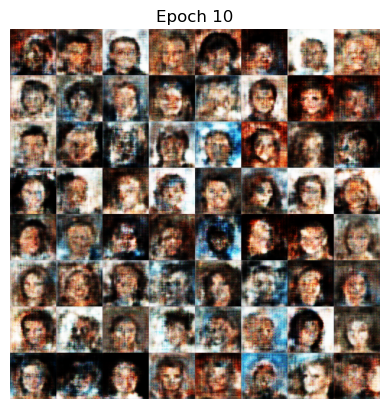

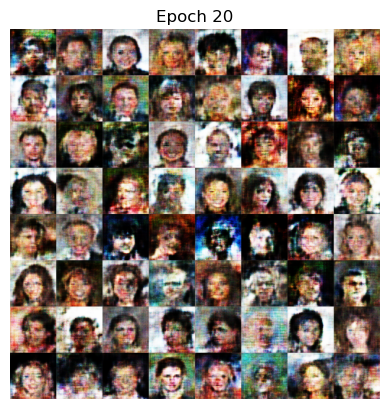

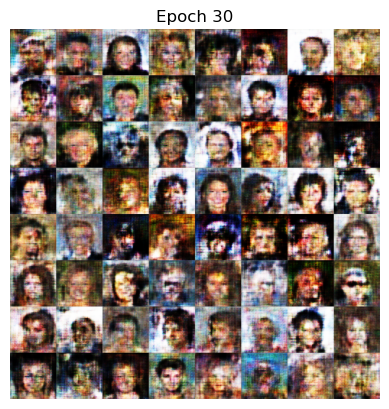

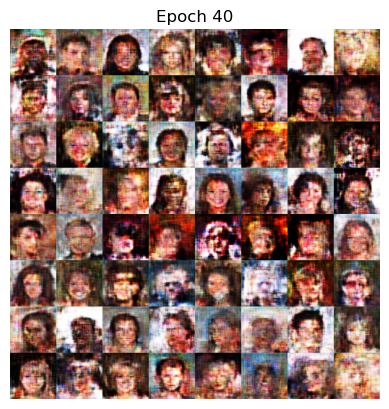

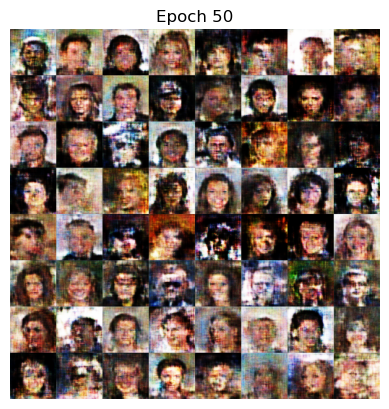

...

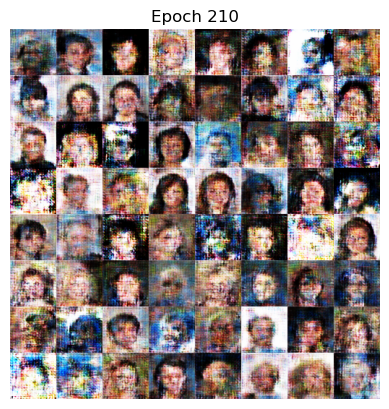

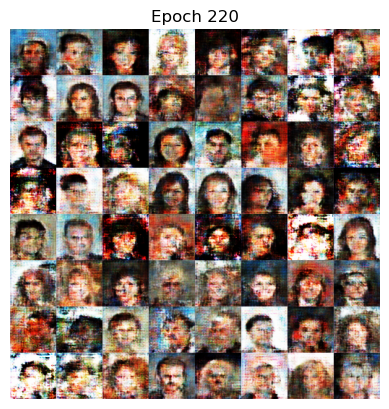

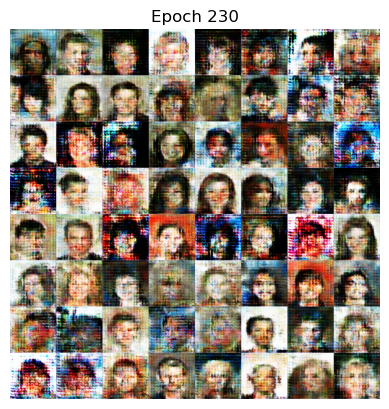

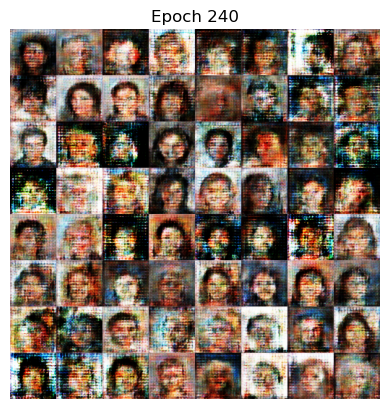

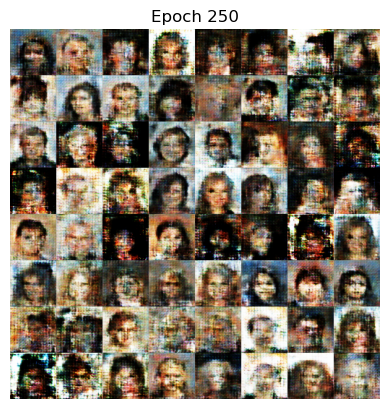

KeyboardInterrupt: 

In [22]:
wlg = [None] * modified_W_EPOCH #record loss of g for each epoch
wld = [None] * modified_W_EPOCH #record loss of d for each epoch
wsp = [None] * modified_W_EPOCH #record sample images for each epoch

rsTrain = float(BATCH_SIZE) / float(len(img_names))
ctr = 0
for ep in range(modified_W_EPOCH):
    ckpt.epoch.assign_add(1)
    print("Epoch: " + str(ckpt.epoch.numpy()), end='\r')
    lgt = 0.0
    ldt = 0.0
    for idx, c1 in enumerate(dsTrain):
        lg, ld = WTrain[ctr](c1)
        ctr += 1
        lgt += lg.numpy()
        ldt += ld.numpy()
        if ctr == WCritic : ctr = 0
    wlg[ep] = lgt * rsTrain
    wld[ep] = ldt * rsTrain
    with open(WLG_PATH,'a') as f:
        f.write(str(lgt * rsTrain) + '\n')
    f.close()
    with open(WLD_PATH,'a') as f:
        f.write(str(ldt * rsTrain) + '\n')
    f.close()
    
    out = modified_WG(s, training = False)
    img = utPuzzle(
        (out * 255.0).numpy().astype(np.uint8),
        SAMPLE_COL,
        SAMPLE_ROW,
        "imgs/w_%04d.png" % ep
    )
    wsp[ep] = img
    if (ep+1) % 10 == 0: 
        plt.imshow(img)
        plt.axis("off")
        plt.title("Epoch %d" % (ep+1))
        plt.show()
    if (ep+1) % 10 == 0: 
        ckpt_manager.save()

In [27]:
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img

def load_gan_img(path):
    image = load_img(path)
    data = img_to_array(image).astype(np.uint8)
    return data

In [28]:
output_img = []
for i in range(0,150,1):
    output_img.append(load_gan_img('imgs/w_%04d.png' % i))
output_img.append(load_gan_img('imgs/w_%04d.png' % 90))
utMakeGif(np.array(output_img), "imgs/wgan.gif", duration = 2)

MoviePy - Building file imgs/wgan.gif with imageio.


# Brief Report

About what you have done
* 如上述

In [24]:
def plot_loss(WLD_PATH,WLG_PATH,modified_W_EPOCH):
    wld = []
    wlg = []
    with open(WLD_PATH) as f:
        lines = f.readlines()
        f.close()
    for line in lines:
        wld.append(float(line.strip('\n')))

    with open(WLG_PATH) as f:
        lines = f.readlines()
        f.close()
    for line in lines:
        wlg.append(float(line.strip('\n')))
    plt.plot(range(modified_W_EPOCH), wld, color = "blue", label = "Discriminator Loss")
    plt.plot(range(modified_W_EPOCH), wlg, color = "red", label = "Generator Loss")
    plt.legend(loc = "lower left")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("WGAN Training Loss")
    plt.show()

# 第一次 train 的結果

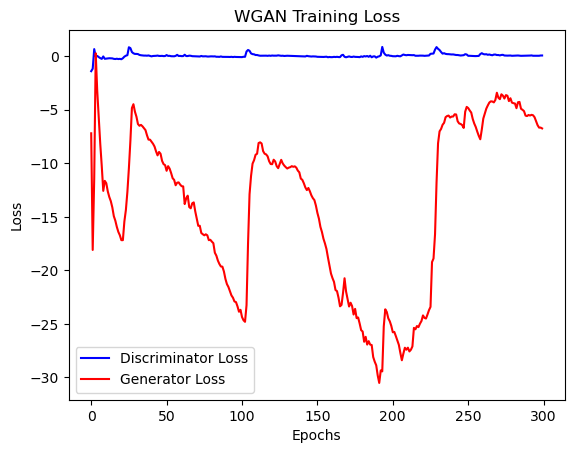

In [109]:
plot_loss(WLD_PATH,WLG_PATH,modified_W_EPOCH)

# 第二次 Train 的結果

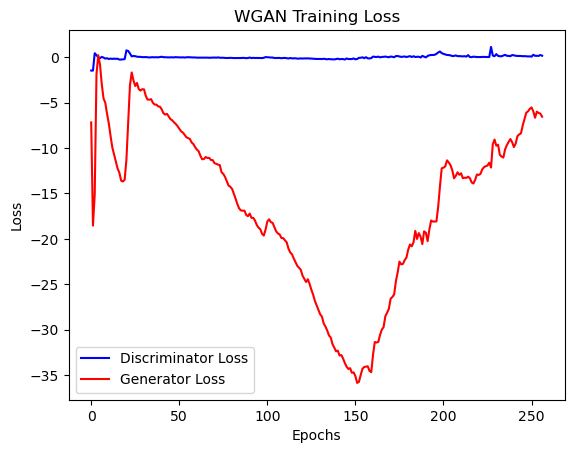

In [26]:
plot_loss(WLD_PATH,WLG_PATH,257)